In [ ]:
!pip install --upgrade polars
!pip install dataprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.7/25.7 MB 27.1 MB/s eta 0:00:00
  Attempting uninstall: polars
    Found existing installation: polars 0.20.2
    Uninstalling polars-0.20.2:
      Successfully uninstalled polars-0.20.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 15.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 78.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 57.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 64.2 MB/s eta 0:00:00
  

In [ ]:
# prompt: tools for data processing , data cleaning and data visualising

# **Data processing libraries:**
import pandas as pd  # Data analysis and manipulation
import numpy as np  # Numerical computing

# **Data cleaning libraries:**
import missingno as msno  # Missing data visualization and imputation
import dataprep.clean  # Data cleaning and preparation
%matplotlib inline
# **Data visualization libraries:**
import seaborn as sns  # Statistical data visualization
import matplotlib.pyplot as plt  # 2D and 3D plotting
import plotly.express as px  # Interactive visualizations
import plotly.graph_objects as go  # Interactive data visualization
import polars as pl
# **Machine learning libraries:**
import sklearn  # Machine learning algorithms
from IPython.core.pylabtools import figsize
figsize(12, 4)
import datetime

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/MyDrive/PFE_ENERGYFORCASTING/predict-energy-behavior-main/data'

In [ ]:
file= file_path +'/weather.csv'

In [ ]:
weather=pd.read_csv(file)

In [ ]:
duplicates = weather.duplicated(subset=['datetime', 'county'], keep=False)

# If there are duplicates, print them out
if duplicates.any():
    print("Duplicate entries found for the same county and datetime:")
    print(weather[duplicates])
else:
    print("No duplicate entries found for the same county and datetime.")

No duplicate entries found for the same county and datetime.


In [ ]:
file1= file_path + '/client.csv'
file2 = file_path + '/electricity_prices.csv'
file3 = file_path + '/gas_prices.csv'
file4 = file_path + '/weather_forecast_summarized.csv'
file5 = file_path + '/weather_historical_summarized.csv'
file6=file_path + '/train.csv'

NameError: name 'file_path' is not defined

In [ ]:
client = pd.read_csv(file1)
prosumer = pd.read_csv(file6)
electricity = pd.read_csv(file2)
gas = pd.read_csv(file3)
weather_historical = pd.read_csv(file5)
weather_forecast = pd.read_csv(file4)


In [ ]:
prosumer = prosumer[prosumer['county'] != 12]

In [ ]:
client = client[client['county'] !=12]

In [ ]:
client.to_csv('/content/drive/MyDrive/PFE_ENERGYFORCASTING/predict-energy-behavior-main/data/cleaned_client.csv')


**Feature extraction**

---



In [ ]:
# prompt: for prosumer I want to modifie the type of datatime to date

prosumer['datetime'] = pd.to_datetime(prosumer['datetime'])


In [ ]:
prosumer

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0
2,0,0,2,0.000,0,2021-09-01 00:00:00,0,2,1
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1
4,0,0,3,2.904,0,2021-09-01 00:00:00,0,4,2
...,...,...,...,...,...,...,...,...,...
2018347,15,1,0,197.233,1,2023-05-31 23:00:00,637,2018347,64
2018348,15,1,1,0.000,0,2023-05-31 23:00:00,637,2018348,59
2018349,15,1,1,28.404,1,2023-05-31 23:00:00,637,2018349,59
2018350,15,1,3,0.000,0,2023-05-31 23:00:00,637,2018350,60


In [ ]:
# prompt: I want to create a new dataframe from prosumer contain datetime and target with condition counsumption==1

df = prosumer[prosumer['is_consumption'] == 1][['datetime', 'target','prediction_unit_id']]


In [ ]:
df['prediction_unit_id'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68])

In [ ]:
# prompt: I want to create dataframe column is prediction_unit_id and iindex is datetime and valeur =target

df_new = df.pivot_table(index='datetime', columns='prediction_unit_id', values='target')


In [ ]:
df_new

prediction_unit_id,0,1,2,3,4,5,6,7,8,9,...,59,60,61,62,63,64,65,66,67,68
datetime,,,,,,,,,,,,,,,,,,,,,
2021-09-01 00:00:00,96.590,17.314,656.859,59.000,501.760,5155.056,2.756,22.841,30.778,23.444,...,17.703,289.159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01 01:00:00,77.691,15.872,595.498,61.600,486.297,4953.258,2.808,21.158,30.468,25.307,...,20.416,280.657,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01 02:00:00,91.594,16.510,598.450,63.100,458.562,4910.692,2.976,20.882,31.419,18.504,...,27.440,295.537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01 03:00:00,87.955,14.271,622.824,64.000,511.794,4700.725,2.704,20.452,29.006,19.368,...,19.050,287.724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01 04:00:00,88.184,18.225,607.308,60.500,520.318,4857.681,3.331,20.878,30.618,20.057,...,21.228,286.074,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 19:00:00,300.096,2.978,645.240,592.897,761.060,8645.581,7.919,24.060,73.647,30.694,...,13.353,171.252,11.249,13.951,16.461,530.777,45.395,26.510,313.989,0.257
2023-05-31 20:00:00,443.340,2.730,933.960,586.746,827.122,9204.993,10.694,38.171,75.532,41.189,...,13.756,232.759,14.582,19.319,19.174,537.154,42.498,32.414,324.015,1.979
2023-05-31 21:00:00,569.301,3.997,1334.727,544.978,808.137,9101.662,13.989,46.264,89.090,63.384,...,24.250,265.328,19.392,23.503,23.625,323.350,43.680,46.259,316.206,6.911


In [ ]:
# prompt: juste determoner new dataframe that contain is counsumption

consommation = prosumer[prosumer['is_consumption'] == 1]


In [ ]:
production = prosumer[prosumer['is_consumption'] == 0]

In [ ]:
consommation

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1
5,0,0,3,656.859,1,2021-09-01 00:00:00,0,5,2
7,0,1,0,59.000,1,2021-09-01 00:00:00,0,7,3
9,0,1,1,501.760,1,2021-09-01 00:00:00,0,9,4
...,...,...,...,...,...,...,...,...,...
2018343,15,0,1,42.401,1,2023-05-31 23:00:00,637,2018343,57
2018345,15,0,3,117.332,1,2023-05-31 23:00:00,637,2018345,58
2018347,15,1,0,197.233,1,2023-05-31 23:00:00,637,2018347,64
2018349,15,1,1,28.404,1,2023-05-31 23:00:00,637,2018349,59


In [ ]:
# prompt: conserve the prosumer to new csv

consommation.to_csv('/content/drive/MyDrive/PFE_ENERGYFORCASTING/predict-energy-behavior-main/data/consommation.csv')


In [ ]:
production.to_csv('/content/drive/MyDrive/PFE_ENERGYFORCASTING/predict-energy-behavior-main/data/production.csv')

In [ ]:
# prompt: this didn't show the 69

# Calculate the number of NaN values in each column
nan_counts = df_new.isna().sum()

# Add a new row with the column names and the number of NaN values
nan_counts = nan_counts.to_frame().T.rename(columns={0: 'count_nan'})

# Print the number of NaN values in each column
print(nan_counts)


prediction_unit_id  count_nan  1  2  3  4  5  6  7  8  9  ...  59  60   61  \
0                           0  0  0  0  0  0  0  0  0  0  ...   0   0  720   

prediction_unit_id   62   63    64    65    66    67     68  
0                   720  720  2183  2927  2927  3671  13652  

[1 rows x 68 columns]


<ipython-input-42-92077a46123b>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure


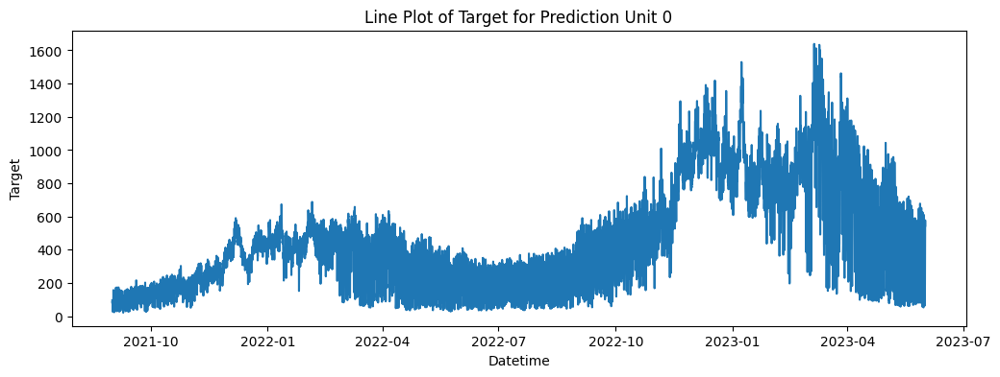

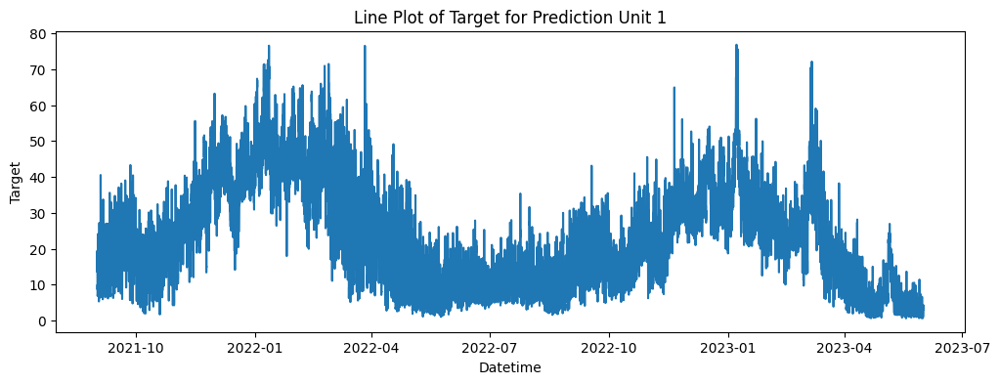

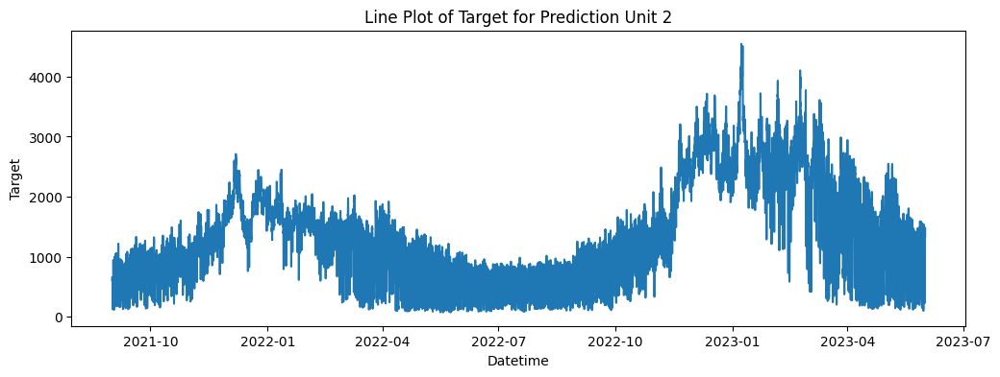

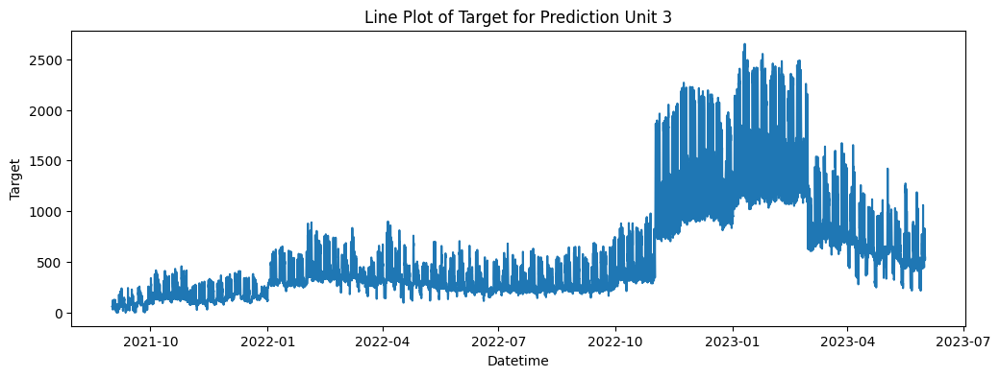

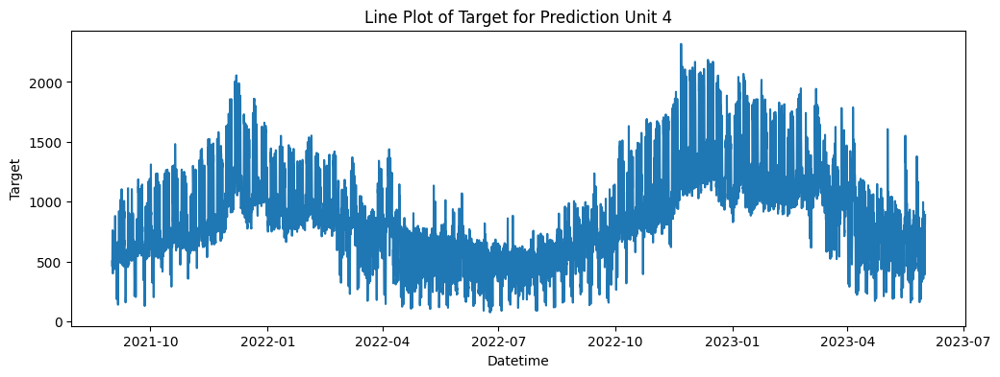

...

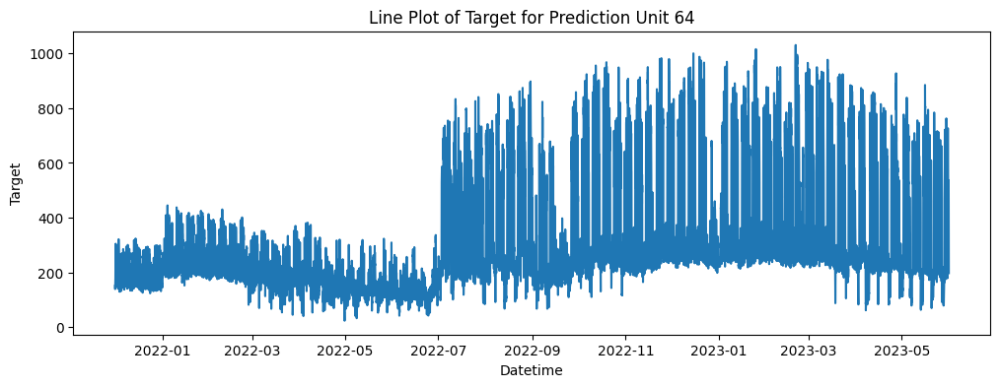

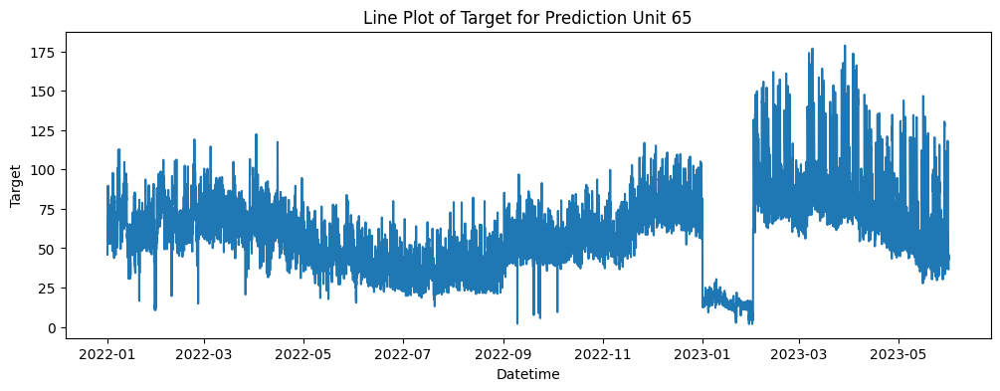

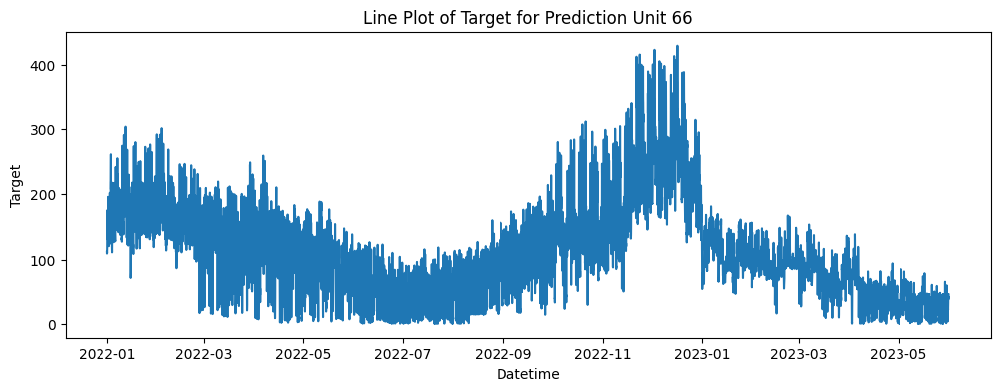

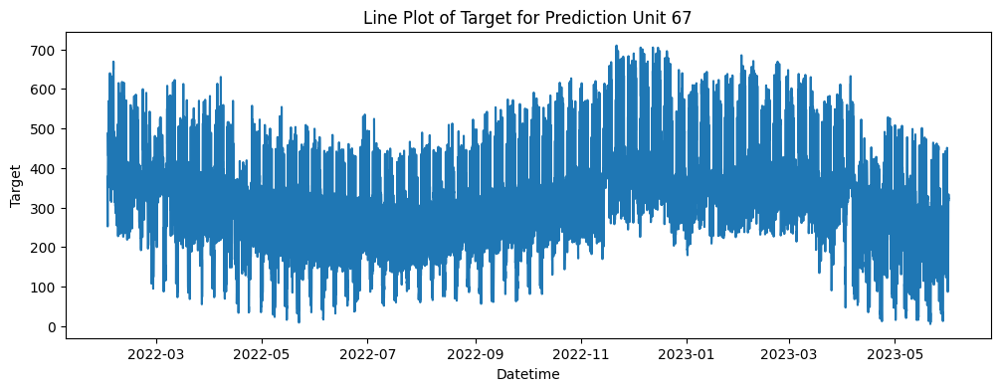

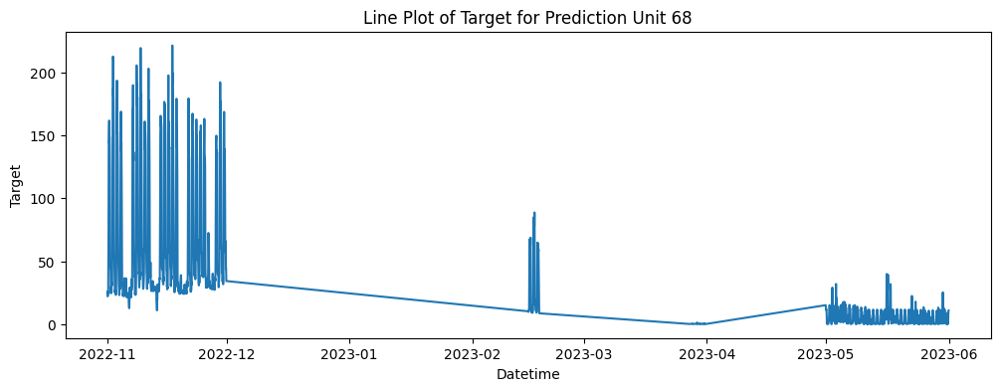

In [ ]:
for prediction_unit_id in df_new.columns:
    plt.figure()  # Create a new figure
    sns.lineplot(data=df_new[prediction_unit_id])
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.title(f'Line Plot of Target for Prediction Unit {prediction_unit_id}')

# Show the plots
plt.show()

<ipython-input-15-25923352f284>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure


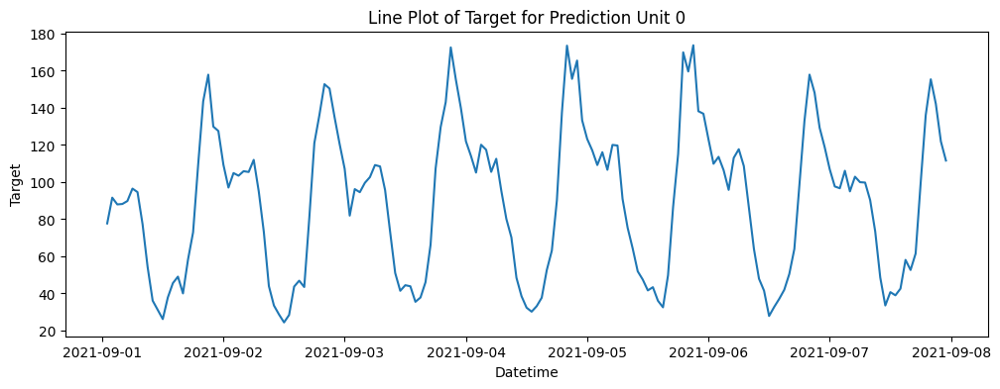

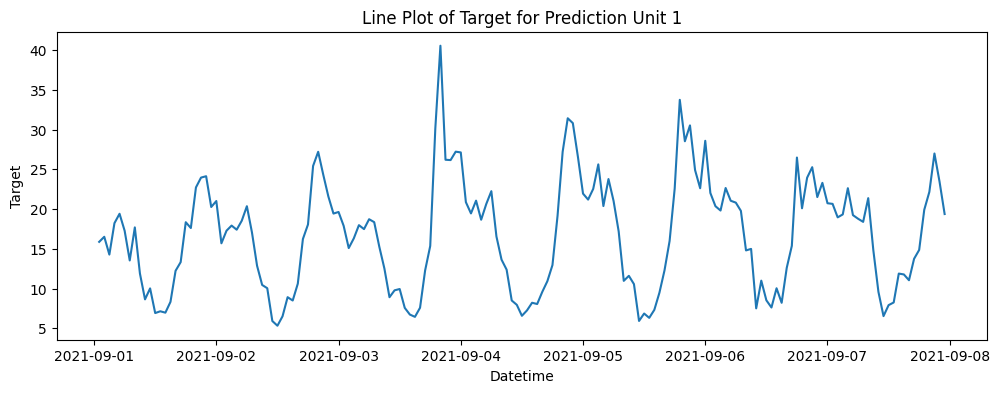

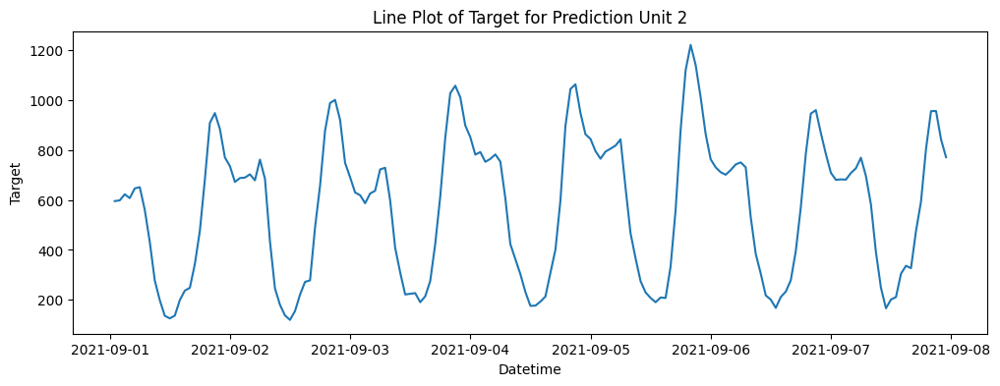

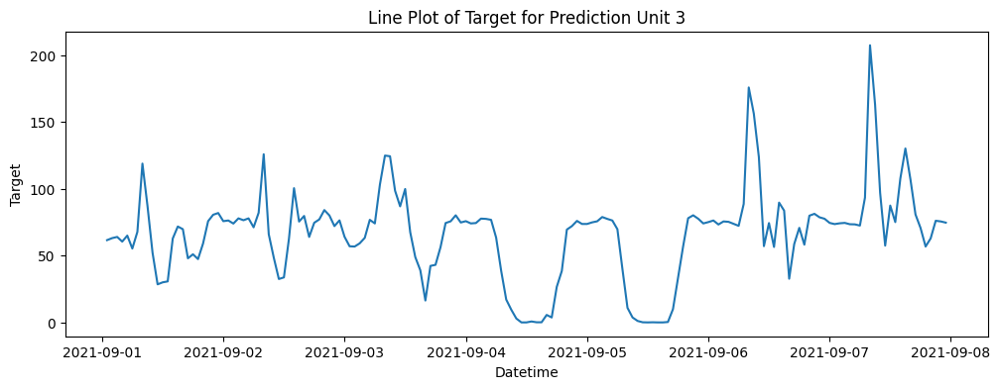

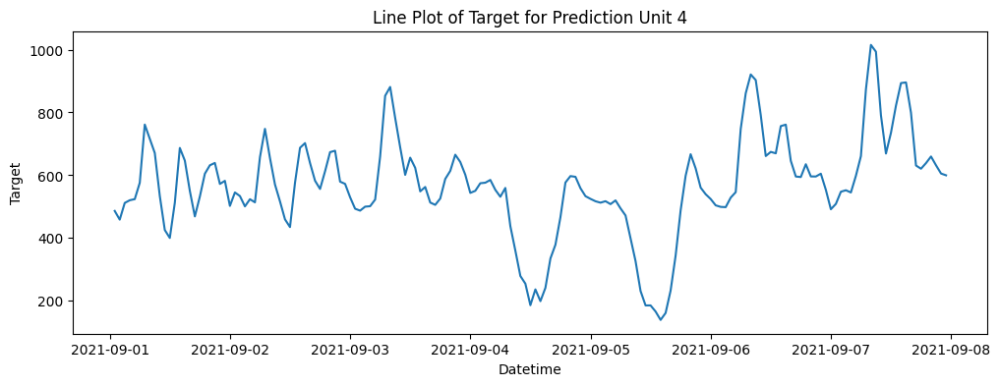

...

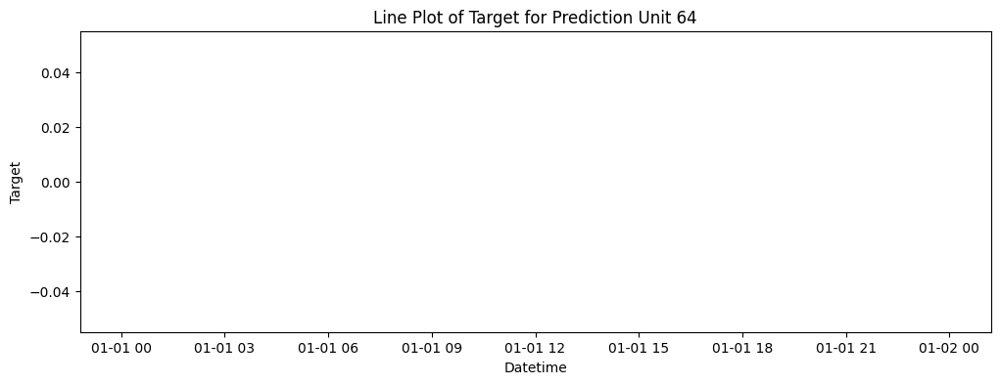

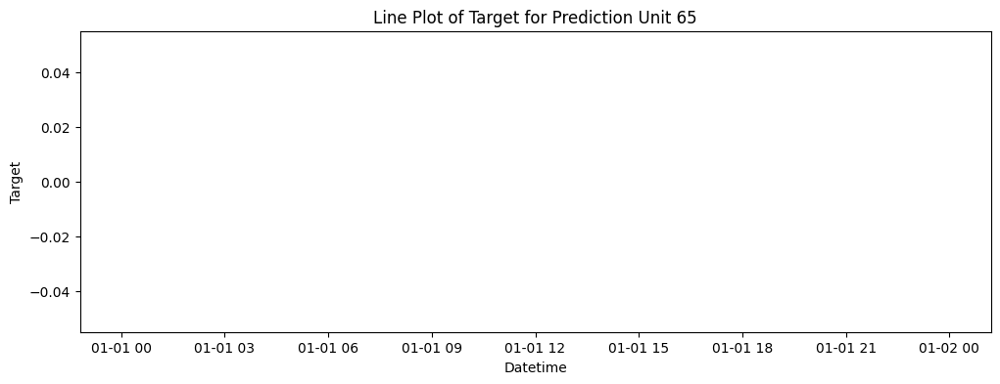

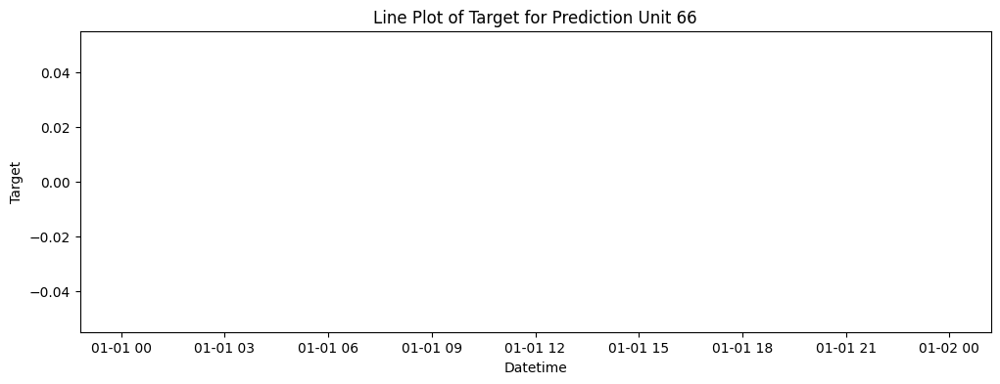

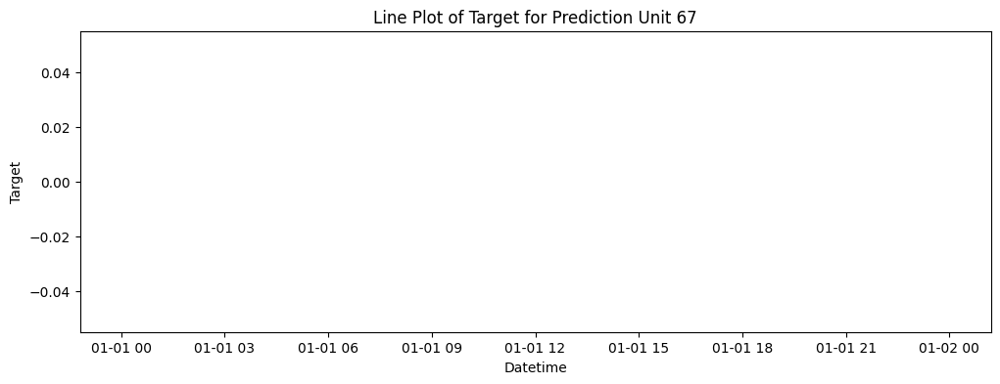

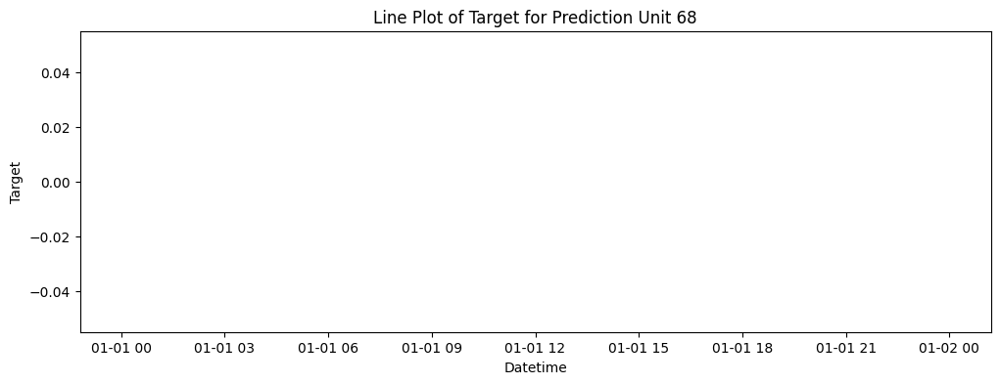

In [ ]:
for prediction_unit_id in df_new.columns:
    plt.figure()  # Create a new figure
    sns.lineplot(data=df_new[prediction_unit_id][(df_new[prediction_unit_id].index > '2021-09-01 00:00:00') & (df_new[prediction_unit_id].index < '2021-09-08 00:00:00')])
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.title(f'Line Plot of Target for Prediction Unit {prediction_unit_id}')

# Show the plots
plt.show()

**Feature Creation**

In [ ]:

def create_features(df):
# create a time series features
  df_new['hour'] = df_new.index.hour
  df_new['dayofweek'] = df_new.index.day_of_week
  df_new['quarter'] = df_new.index.quarter
  df_new['month'] =df_new.index.month
  df_new['year'] = df_new.index.year
  df_new['dayofyear'] = df_new.index.day_of_year
  return df


In [ ]:
df_new = create_features(df_new)

In [ ]:
df_new

prediction_unit_id,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,hour,dayofweek,quarter,month,year,dayofyear
datetime,,,,,,,,,,,,,,,,,,,,,
2021-09-01 00:00:00,96.590,17.314,656.859,59.000,501.760,5155.056,2.756,22.841,30.778,23.444,...,NaN,NaN,NaN,NaN,0,2,3,9,2021,244
2021-09-01 01:00:00,77.691,15.872,595.498,61.600,486.297,4953.258,2.808,21.158,30.468,25.307,...,NaN,NaN,NaN,NaN,1,2,3,9,2021,244
2021-09-01 02:00:00,91.594,16.510,598.450,63.100,458.562,4910.692,2.976,20.882,31.419,18.504,...,NaN,NaN,NaN,NaN,2,2,3,9,2021,244
2021-09-01 03:00:00,87.955,14.271,622.824,64.000,511.794,4700.725,2.704,20.452,29.006,19.368,...,NaN,NaN,NaN,NaN,3,2,3,9,2021,244
2021-09-01 04:00:00,88.184,18.225,607.308,60.500,520.318,4857.681,3.331,20.878,30.618,20.057,...,NaN,NaN,NaN,NaN,4,2,3,9,2021,244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 19:00:00,300.096,2.978,645.240,592.897,761.060,8645.581,7.919,24.060,73.647,30.694,...,45.395,26.510,313.989,0.257,19,2,2,5,2023,151
2023-05-31 20:00:00,443.340,2.730,933.960,586.746,827.122,9204.993,10.694,38.171,75.532,41.189,...,42.498,32.414,324.015,1.979,20,2,2,5,2023,151
2023-05-31 21:00:00,569.301,3.997,1334.727,544.978,808.137,9101.662,13.989,46.264,89.090,63.384,...,43.680,46.259,316.206,6.911,21,2,2,5,2023,151


In [ ]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15308 entries, 2021-09-01 00:00:00 to 2023-05-31 23:00:00
Data columns (total 75 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   0          15308 non-null  float64
 1   1          15308 non-null  float64
 2   2          15308 non-null  float64
 3   3          15308 non-null  float64
 4   4          15308 non-null  float64
 5   5          15308 non-null  float64
 6   6          15308 non-null  float64
 7   7          15308 non-null  float64
 8   8          15308 non-null  float64
 9   9          15308 non-null  float64
 10  10         15308 non-null  float64
 11  11         15308 non-null  float64
 12  12         15308 non-null  float64
 13  13         15308 non-null  float64
 14  14         15308 non-null  float64
 15  15         15308 non-null  float64
 16  16         15308 non-null  float64
 17  17         15308 non-null  float64
 18  18         15308 non-null  float64
 19  19         

In [ ]:
df_new[68]

datetime
2021-09-01 00:00:00       NaN
2021-09-01 01:00:00       NaN
2021-09-01 02:00:00       NaN
2021-09-01 03:00:00       NaN
2021-09-01 04:00:00       NaN
                        ...  
2023-05-31 19:00:00     0.257
2023-05-31 20:00:00     1.979
2023-05-31 21:00:00     6.911
2023-05-31 22:00:00    10.401
2023-05-31 23:00:00    10.859
Name: 68, Length: 15308, dtype: float64

In [ ]:
df_new[['hour', 0]]

prediction_unit_id,hour,0
datetime,,
2021-09-01 00:00:00,0,96.590
2021-09-01 01:00:00,1,77.691
2021-09-01 02:00:00,2,91.594
2021-09-01 03:00:00,3,87.955
2021-09-01 04:00:00,4,88.184
...,...,...
2023-05-31 19:00:00,19,300.096
2023-05-31 20:00:00,20,443.340
2023-05-31 21:00:00,21,569.301


**visualize our feature  / target Realtionship**

In [ ]:
# prompt: covertir the df_new to dataframe

df_new = pd.DataFrame(df_new)


In [ ]:
df_new

prediction_unit_id,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,hour,dayofweek,quarter,month,year,dayofyear
datetime,,,,,,,,,,,,,,,,,,,,,
2021-09-01 00:00:00,96.590,17.314,656.859,59.000,501.760,5155.056,2.756,22.841,30.778,23.444,...,NaN,NaN,NaN,NaN,0,2,3,9,2021,244
2021-09-01 01:00:00,77.691,15.872,595.498,61.600,486.297,4953.258,2.808,21.158,30.468,25.307,...,NaN,NaN,NaN,NaN,1,2,3,9,2021,244
2021-09-01 02:00:00,91.594,16.510,598.450,63.100,458.562,4910.692,2.976,20.882,31.419,18.504,...,NaN,NaN,NaN,NaN,2,2,3,9,2021,244
2021-09-01 03:00:00,87.955,14.271,622.824,64.000,511.794,4700.725,2.704,20.452,29.006,19.368,...,NaN,NaN,NaN,NaN,3,2,3,9,2021,244
2021-09-01 04:00:00,88.184,18.225,607.308,60.500,520.318,4857.681,3.331,20.878,30.618,20.057,...,NaN,NaN,NaN,NaN,4,2,3,9,2021,244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 19:00:00,300.096,2.978,645.240,592.897,761.060,8645.581,7.919,24.060,73.647,30.694,...,45.395,26.510,313.989,0.257,19,2,2,5,2023,151
2023-05-31 20:00:00,443.340,2.730,933.960,586.746,827.122,9204.993,10.694,38.171,75.532,41.189,...,42.498,32.414,324.015,1.979,20,2,2,5,2023,151
2023-05-31 21:00:00,569.301,3.997,1334.727,544.978,808.137,9101.662,13.989,46.264,89.090,63.384,...,43.680,46.259,316.206,6.911,21,2,2,5,2023,151


<ipython-input-44-28fcdbbb456f>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure


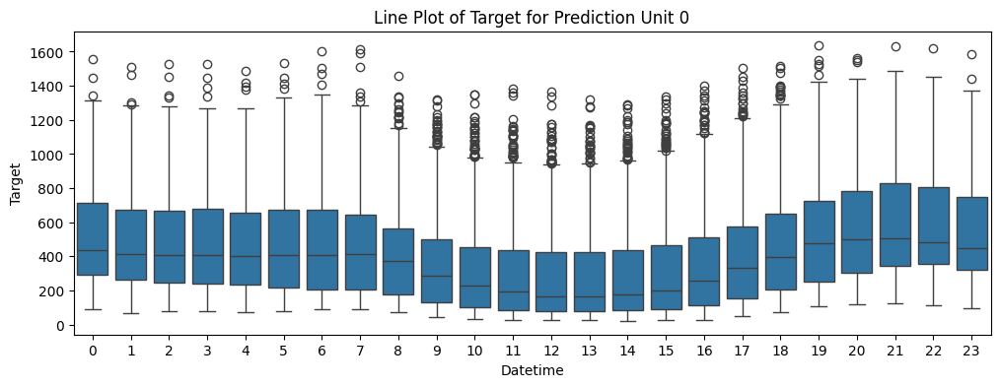

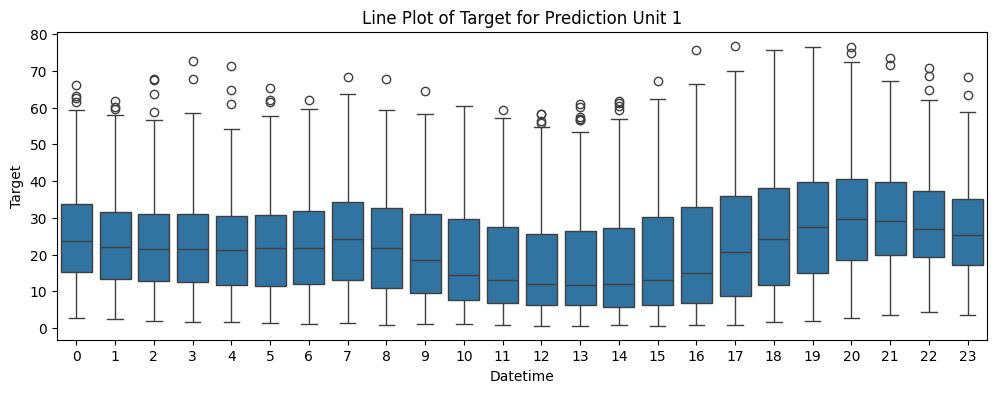

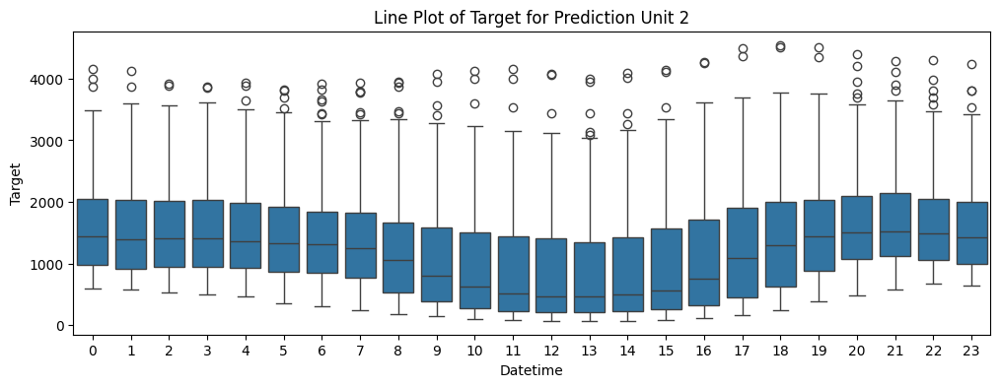

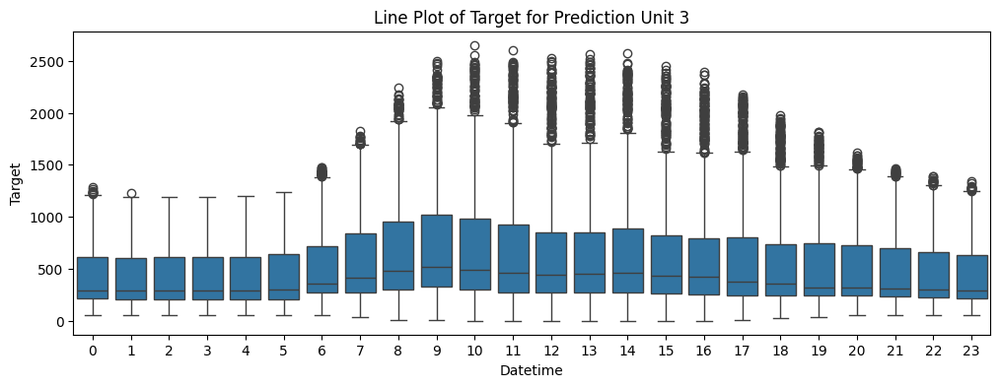

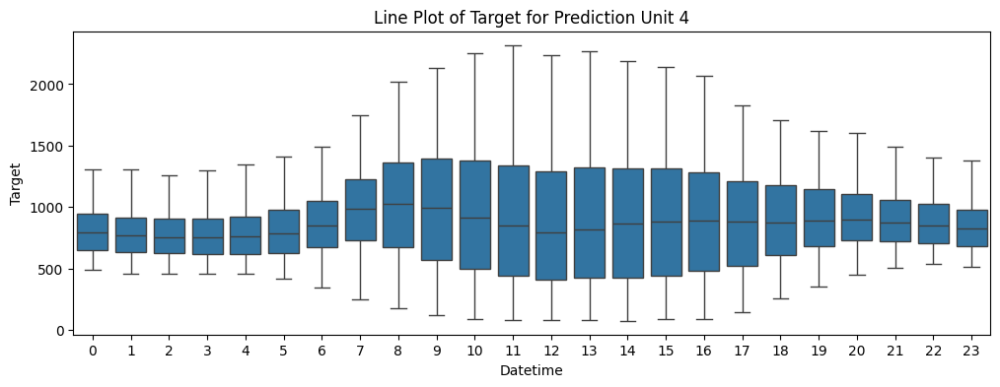

...

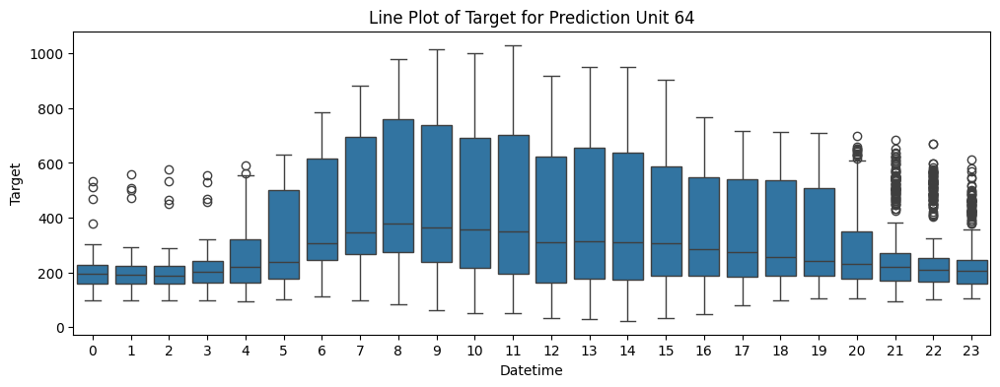

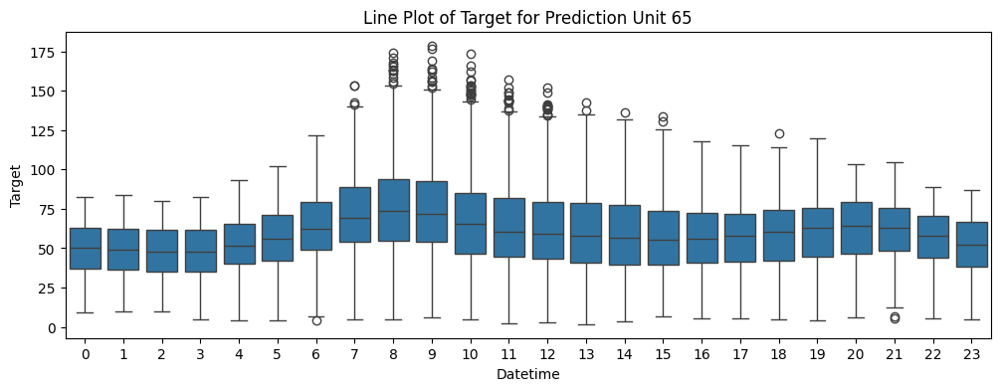

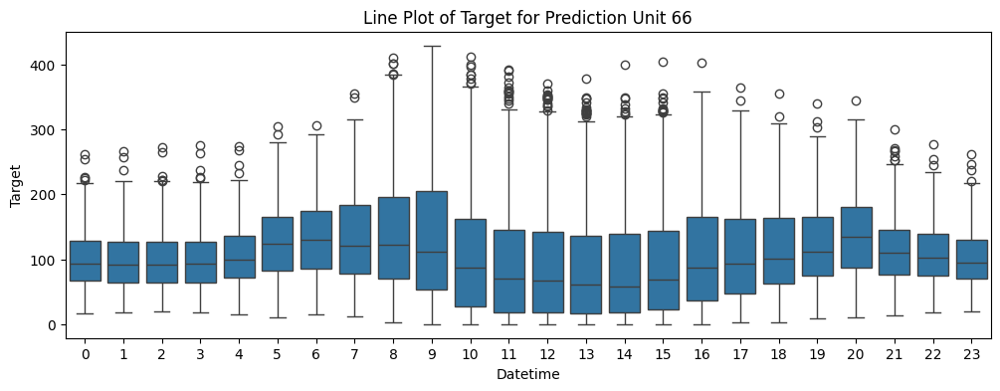

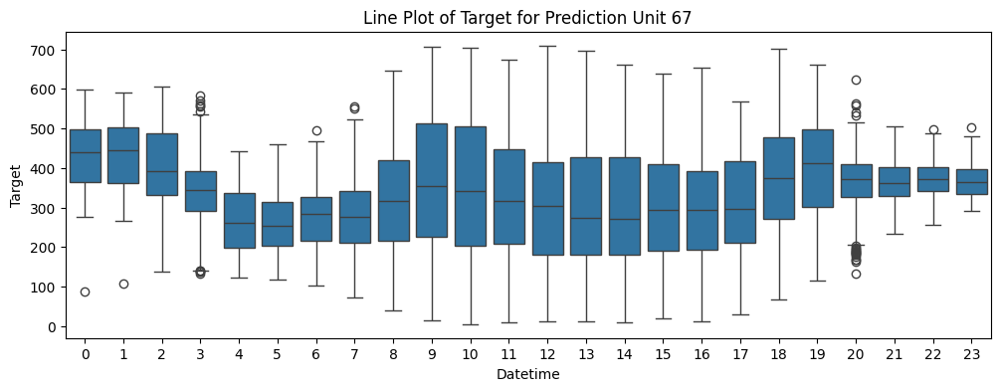

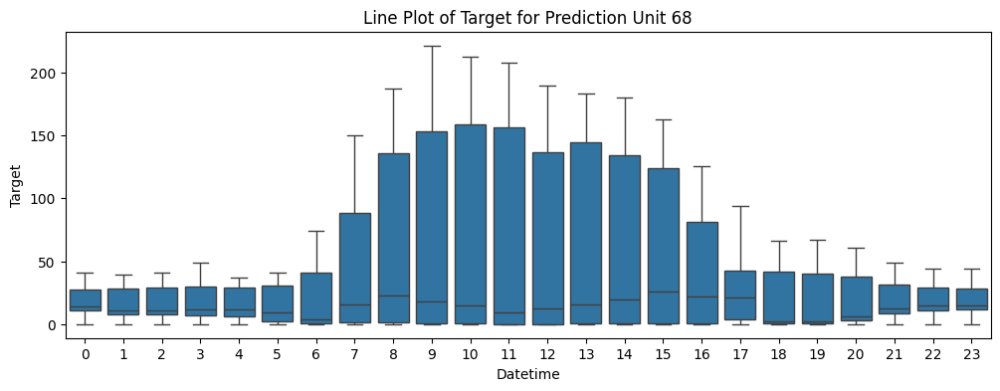

In [ ]:


# Loop through each 'prediction_unit_id' column
for i in range (69):
    plt.figure()  # Create a new figure
    sns.boxplot(data=df_new[['hour', i]], x='hour',y=df_new[i])

    # Set plot labels and title
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.title(f'consomation en fonction d hours{i}')

# Show the plots
plt.show()

<ipython-input-45-f6cd129c9794>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure


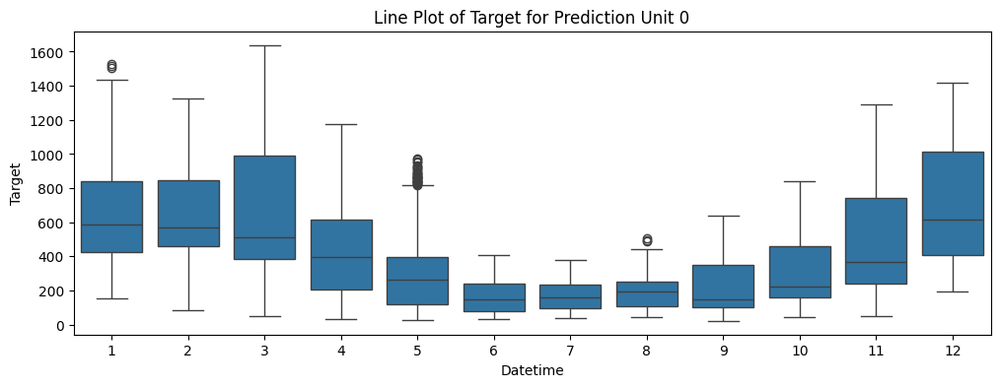

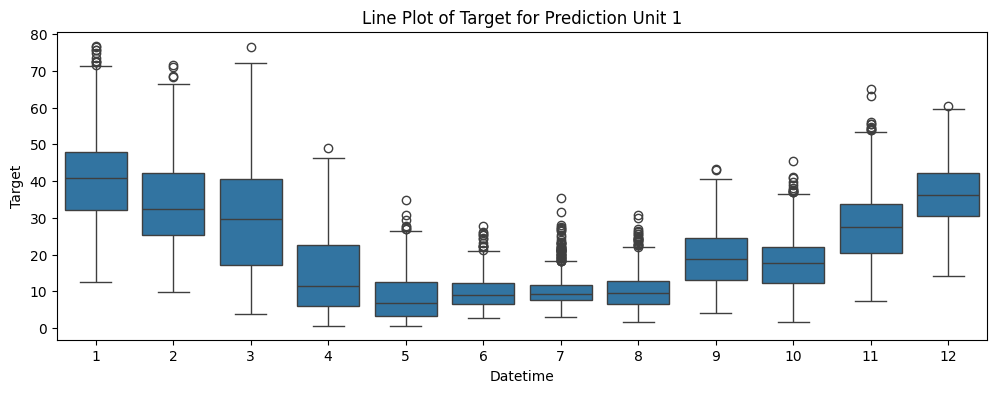

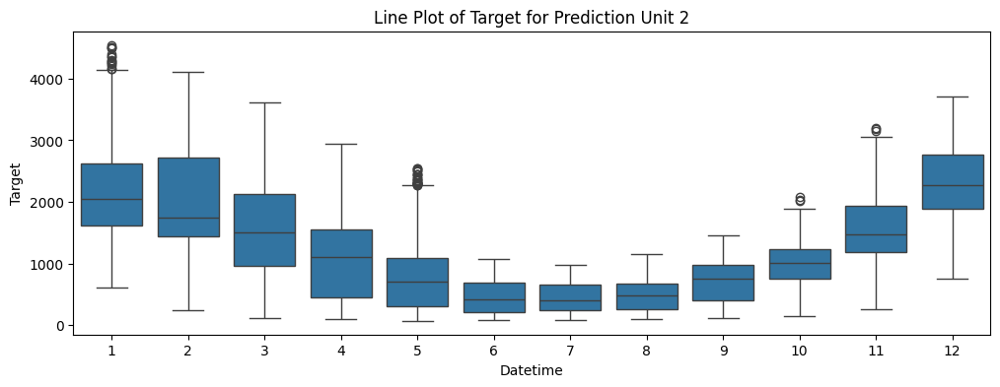

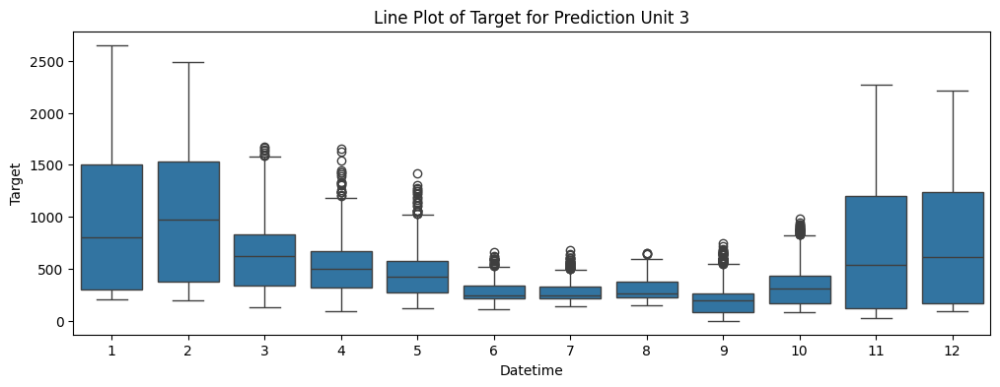

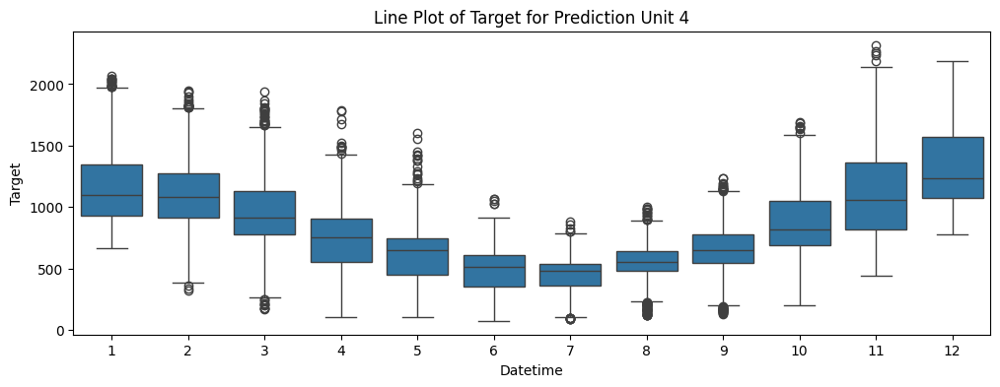

...

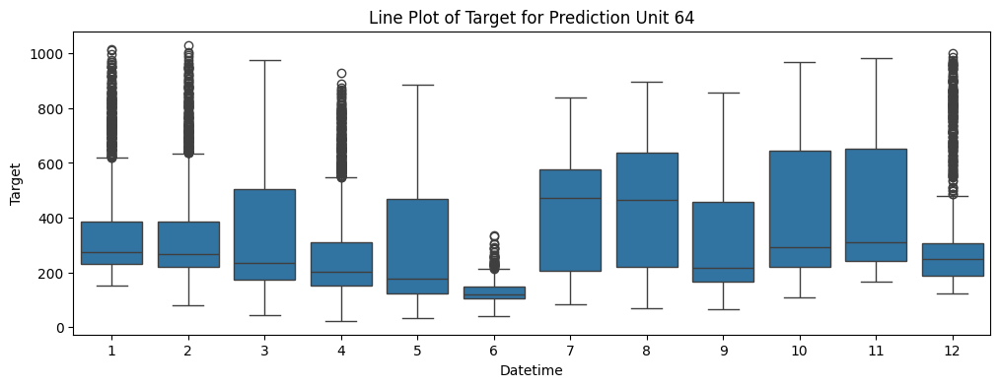

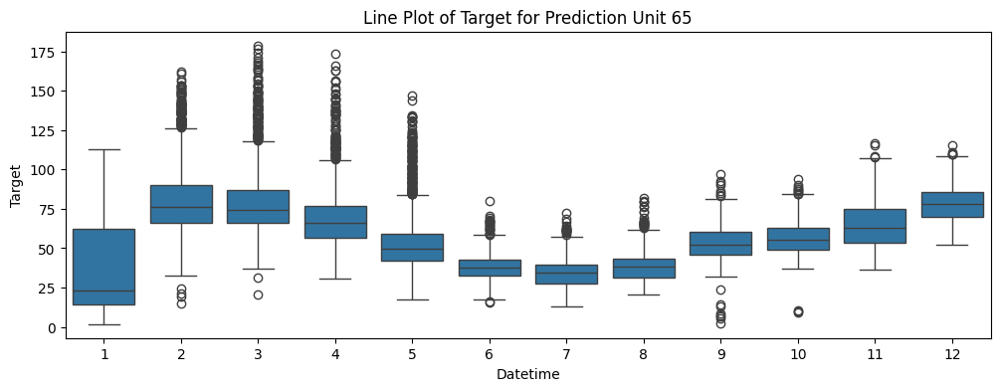

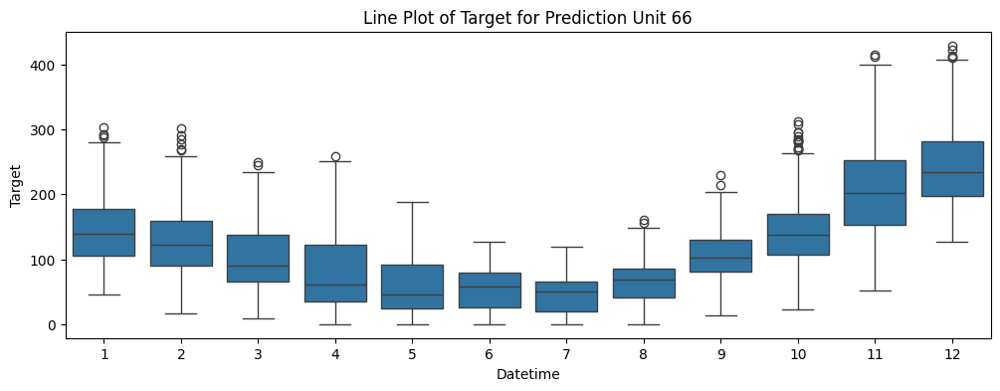

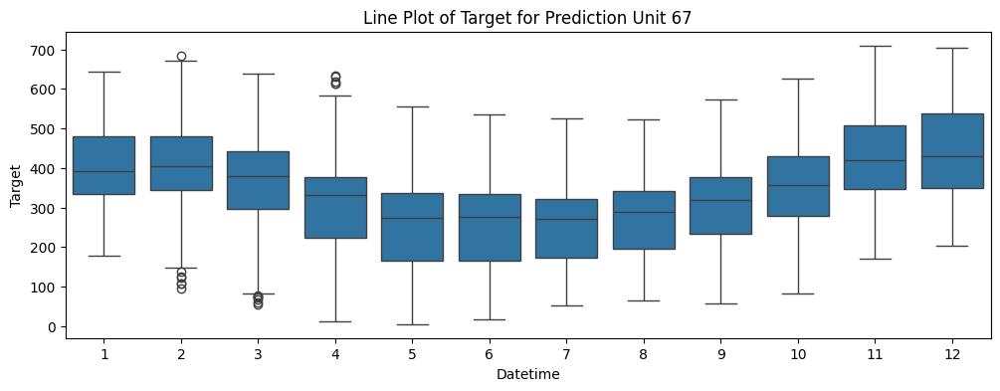

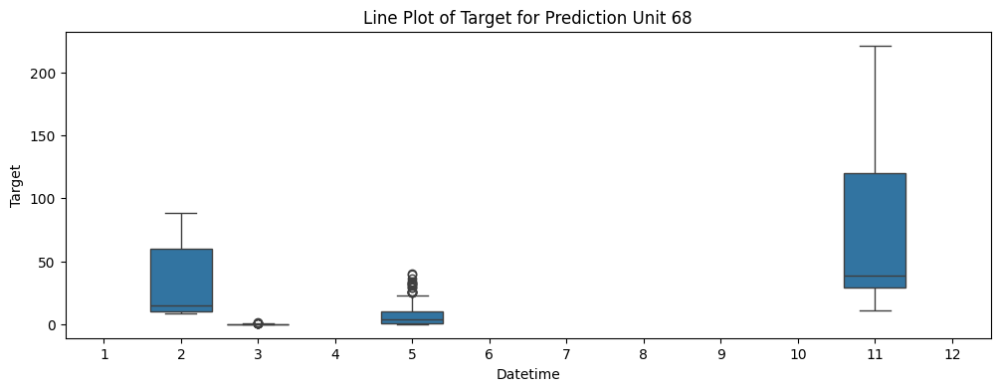

In [ ]:
# Loop through each 'prediction_unit_id' column
for i in range (69):
    plt.figure()  # Create a new figure
    sns.boxplot(data=df_new[['month', i]], x='month',y=df_new[i])

    # Set plot labels and title
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.title(f'consomation by month {i}')

# Show the plots
plt.show()

In [ ]:
# prompt: print the details of all my dataframes

print("Client data:")
print(client.info())

print("\nProsumer data:")
print(prosumer.info())

print("\nElectricity data:")
print(electricity.info())

print("\nGas data:")
print(gas.info())

print("\nWeather forecast data:")
print(weather_forecast.info())

print("\nWeather historical data:")
print(weather_historical.info())


Client data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41919 entries, 0 to 41918
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_type        41919 non-null  int64  
 1   county              41919 non-null  int64  
 2   eic_count           41919 non-null  int64  
 3   installed_capacity  41919 non-null  float64
 4   is_business         41919 non-null  int64  
 5   date                41919 non-null  object 
 6   data_block_id       41919 non-null  int64  
dtypes: float64(1), int64(5), object(1)
memory usage: 2.2+ MB
None

Prosumer data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 9 columns):
 #   Column              Dtype  
---  ------              -----  
 0   county              int64  
 1   is_business         int64  
 2   product_type        int64  
 3   target              float64
 4   is_consumption      int64  
 5   datetim

remove les ligne dupliquer


In [ ]:
import pandas as pd


client = pd.concat([client, client]).drop_duplicates(subset=["date", "county", "is_business", "product_type"])
gas = pd.concat([gas, gas]).drop_duplicates(subset=["forecast_date"])
electricity = pd.concat([electricity, electricity]).drop_duplicates(subset=["forecast_date"])
weather_forecast = pd.concat([weather_forecast, weather_forecast]).drop_duplicates(subset=["forecast_datetime", "hours_ahead", "county"])
weather_historical = pd.concat([weather_historical, weather_historical]).drop_duplicates(subset=["datetime", "county"])
prosumer = pd.concat([prosumer, prosumer]).drop_duplicates(subset=["datetime", "county", "is_business", "product_type", "is_consumption"])


In [ ]:
prosumer['county'==12]

In [ ]:
prosumer.shape

(2018352, 9)

In [ ]:
historical_columns = weather_historical.columns
forecast_columns = weather_forecast.columns

exclude_columns = ['county', 'county_name', 'data_block_id']

for column in forecast_columns:
    if column not in exclude_columns and column in historical_columns:
        new_column_name = column + " (forecast)"
        weather_forecast.rename(columns={column: new_column_name}, inplace=True)


In [ ]:
electricity.rename(columns={'forecast_date': 'forecast_date_elec'}, inplace=True)

electricity.rename(columns={'origin_date': 'origin_date_elec'}, inplace=True)

In [ ]:
weather_historical.to_csv('/content/drive/MyDrive/PFE_ENERGYFORCASTING/predict-energy-behavior-main/data/weather.csv')

In [ ]:
# prompt: I want delte the coulumns cloudcover_low	cloudcover_mid	cloudcover_high

weather_historical = weather_historical.drop(['county_name'], axis=1)


**Merge Dataset ⭐⭐⭐**

---



In [ ]:

output = pd.merge(client, prosumer, on=['county', 'product_type', 'data_block_id','is_business'], how='inner')

In [ ]:
output = pd.merge(output,weather_historical, on=['data_block_id'], how='inner')

In [ ]:
output = pd.merge(output,weather_forecast, on=['county','data_block_id','county_name'], how='inner')

In [ ]:
output = pd.merge(output,gas, on=['data_block_id'], how='inner')

In [ ]:
output = pd.merge(output,electricity, on=['data_block_id'], how='inner')

In [ ]:
output

,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id,target,is_consumption,datetime,row_id,prediction_unit_id
0,1,0,108,952.89,0,2021-09-01,2,0.793,0,2021-09-03 00:00:00,5856,0
1,1,0,108,952.89,0,2021-09-01,2,107.129,1,2021-09-03 00:00:00,5857,0
2,1,0,108,952.89,0,2021-09-01,2,2.106,0,2021-09-03 01:00:00,5978,0
3,1,0,108,952.89,0,2021-09-01,2,81.920,1,2021-09-03 01:00:00,5979,0
4,1,0,108,952.89,0,2021-09-01,2,0.955,0,2021-09-03 02:00:00,6100,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2009707,3,15,55,2188.20,1,2023-05-29,637,265.328,1,2023-05-31 21:00:00,2018091,60
2009708,3,15,55,2188.20,1,2023-05-29,637,0.001,0,2023-05-31 22:00:00,2018220,60
2009709,3,15,55,2188.20,1,2023-05-29,637,274.569,1,2023-05-31 22:00:00,2018221,60
2009710,3,15,55,2188.20,1,2023-05-29,637,0.000,0,2023-05-31 23:00:00,2018350,60


In [ ]:
weather_historical = pd.read_csv(file5)